<a href="https://colab.research.google.com/github/Haroon-jay/dog-breed-identification/blob/main/dog-vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np



```
# This is formatted as code
```



In [2]:
 #!unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/MyDrive/Dog Vision 2"

In [3]:
import tensorflow as tf
print(tf.__version__)

2.17.0


In [4]:
import tensorflow_hub as hub
print("GPU available") if tf.config.list_physical_devices("GPU") else print("GPU not available")

GPU available


# Turn images to tensor

In [5]:
import pandas as pd

In [6]:
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")

In [7]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [8]:
labels_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,fff43b07992508bc822f33d8ffd902ae,scottish_deerhound
freq,1,126


In [9]:
labels_csv["breed"].value_counts().median()

82.0

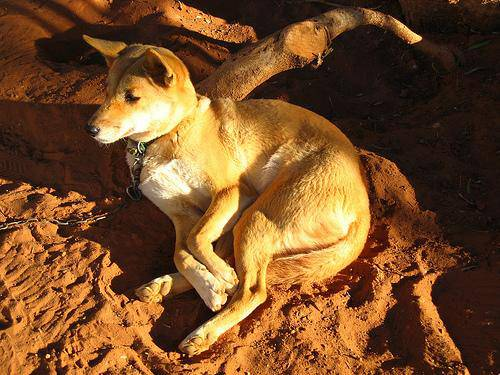

In [10]:
#from IPython.display import Image
#Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

In [11]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [12]:
filenames = ["drive/MyDrive/Dog Vision 2/train/" + fname + '.jpg' for fname in labels_csv["id"]]
len(filenames)

10222

In [13]:
import os
if(len(os.listdir("drive/MyDrive/Dog Vision 2/train")) == len(filenames)):
  print("All images are present")

else:
  print("Some images are missing")

All images are present


In [14]:
len(filenames)

10222

In [15]:
len(os.listdir("drive/MyDrive/Dog Vision 2/train"))

10222

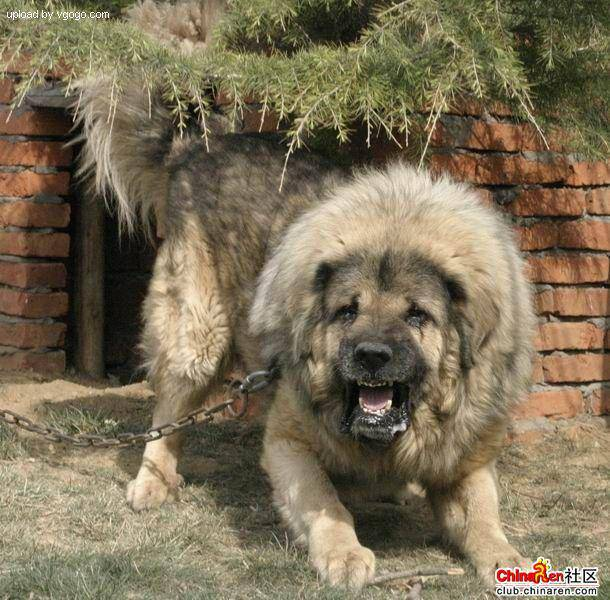

In [16]:
Image(filenames[9000])

In [17]:
labels_csv["breed"][9000]

'tibetan_mastiff'

In [18]:
import numpy as np
labels = labels_csv["breed"].to_numpy()

if(len(labels) == len(filenames)):
  print("All labels are present")

else:
  print("Some labels are missing")

All labels are present


In [19]:
unique_breeds = (np.unique(labels))

In [20]:
boolean_labels = [label == unique_breeds for label in labels]

In [21]:
boolean_labels

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [22]:
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [23]:
X = filenames
y = boolean_labels
from sklearn.model_selection import train_test_split

In [24]:
X_train,X_val,y_train,y_val = train_test_split(X[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2, random_state=42 )

In [25]:
len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [26]:
X_train[:5]

['drive/MyDrive/Dog Vision 2/train/00bee065dcec471f26394855c5c2f3de.jpg',
 'drive/MyDrive/Dog Vision 2/train/0d2f9e12a2611d911d91a339074c8154.jpg',
 'drive/MyDrive/Dog Vision 2/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
 'drive/MyDrive/Dog Vision 2/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
 'drive/MyDrive/Dog Vision 2/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg']

In [27]:
IMG_SIZE=128

In [28]:
def process_img(image_path):
  image = tf.io.read_file(image_path)
  image = tf.image.decode_jpeg(image, channels=3)
  image = tf.image.convert_image_dtype(image, tf.float32)
  image = tf.image.resize(image, size=[IMG_SIZE,IMG_SIZE])
  return image

In [29]:
def get_img_label(image_path,label):
  image = process_img(image_path)
  return image,label

In [30]:
(get_img_label(X[42], y[42]))

(<tf.Tensor: shape=(128, 128, 3), dtype=float32, numpy=
 array([[[0.27929032, 0.4751063 , 0.2795834 ],
         [0.27585176, 0.46525738, 0.26177704],
         [0.3406097 , 0.52753276, 0.30271655],
         ...,
         [0.2751685 , 0.49869794, 0.29869792],
         [0.28818935, 0.51209253, 0.31603253],
         [0.29382864, 0.52127963, 0.33304432]],
 
        [[0.21575989, 0.41348663, 0.2655423 ],
         [0.29273564, 0.48136288, 0.32789788],
         [0.3189494 , 0.505239  , 0.33296594],
         ...,
         [0.25343138, 0.47303924, 0.28489584],
         [0.2582874 , 0.4802207 , 0.2991575 ],
         [0.27520525, 0.49873468, 0.32627755]],
 
        [[0.1963847 , 0.39246315, 0.28385404],
         [0.2122244 , 0.4047182 , 0.29629302],
         [0.22513789, 0.41602883, 0.29334742],
         ...,
         [0.22732845, 0.44489893, 0.27724636],
         [0.23500296, 0.45068926, 0.2900581 ],
         [0.25955886, 0.47524515, 0.32041976]],
 
        ...,
 
        [[0.13864364, 0.17785932

In [31]:
BATCH_SIZE = 32

def create_data_batches(X, y=None, batch_size = BATCH_SIZE, valid_data = False,test_data=False):

  if(test_data):
    print("Creating test data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_img).batch(BATCH_SIZE)
    return data_batch

  elif(valid_data):
    print("Creating validation data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
    data_batch = data.map(get_img_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(y)))
    data = data.shuffle(buffer_size=len(X))
    data = data.map(get_img_label)
    data_batch = data.batch(BATCH_SIZE)
    return data_batch






In [32]:
train_data = create_data_batches(X_train,y_train)
val_data = create_data_batches(X_val,y_val,valid_data=True)

Creating training data batches
Creating validation data batches


In [33]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [34]:
import matplotlib.pyplot as plt

def show_25_images(images, labels):
  plt.figure(figsize=(10,10))
  for i in range(25):
    ax = plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")


In [35]:
train_images,train_labels = next(train_data.as_numpy_iterator())
train_images,train_labels

(array([[[[4.92040329e-02, 5.84797636e-02, 1.31049007e-01],
          [1.37196019e-01, 2.78112084e-01, 3.06053281e-01],
          [5.29474579e-02, 2.45232940e-01, 2.61342019e-01],
          ...,
          [6.22251868e-01, 5.21164238e-01, 3.93498808e-01],
          [5.73332131e-01, 4.61230367e-01, 3.01931947e-01],
          [5.35472453e-01, 4.23370779e-01, 2.64072329e-01]],
 
         [[7.87610263e-02, 5.05514722e-03, 3.40919085e-02],
          [5.36331534e-03, 1.97578594e-02, 2.85795946e-02],
          [5.42315363e-04, 4.84191924e-02, 5.07782623e-02],
          ...,
          [6.78884804e-01, 5.86660504e-01, 4.32622552e-01],
          [6.52794778e-01, 5.46912432e-01, 3.62796038e-01],
          [6.07192397e-01, 5.01310050e-01, 3.18052709e-01]],
 
         [[5.46538122e-02, 3.57107781e-02, 1.26378685e-02],
          [2.84627383e-03, 1.03247557e-02, 2.60416651e-04],
          [0.00000000e+00, 1.48131140e-02, 0.00000000e+00],
          ...,
          [5.70435107e-01, 4.80239034e-01, 3.1525

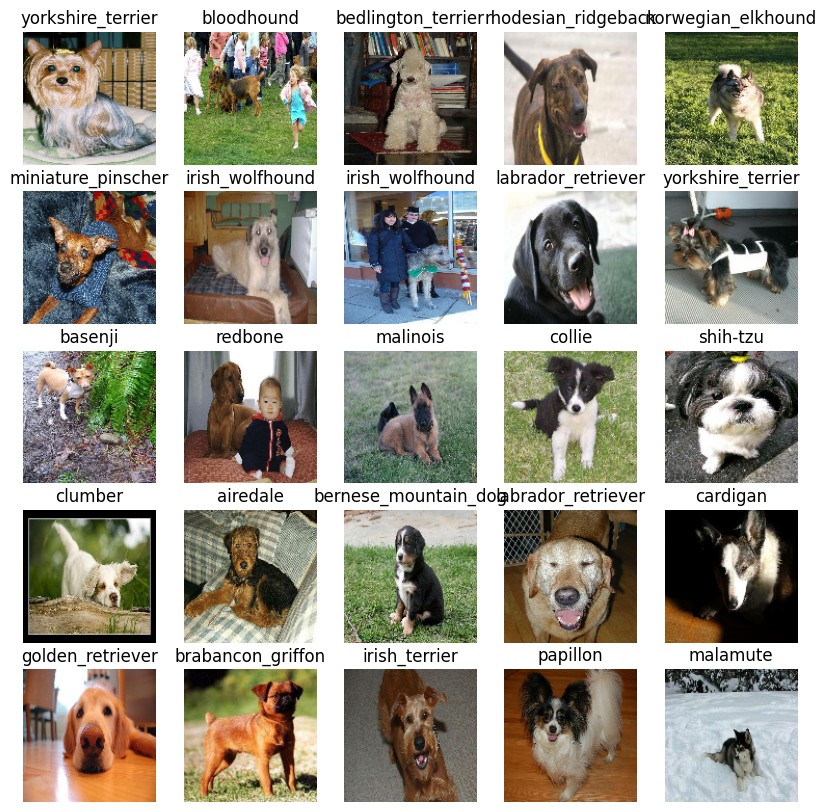

In [36]:
show_25_images(train_images,train_labels)

In [37]:
INPUT_SHAPE = [None,IMG_SIZE,IMG_SIZE,3]
OUTPUT_SHAPE = len(unique_breeds)
MODEL_URL="https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/035-128-classification/2"



In [38]:
detector = hub.load(MODEL_URL)


import tf_keras
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", model_url)
  model = tf_keras.Sequential([
      hub.KerasLayer(model_url),
      tf_keras.layers.Dense(units=OUTPUT_SHAPE, activation="softmax")
  ])
  model.compile(
      loss=tf_keras.losses.CategoricalCrossentropy(),
      optimizer=tf_keras.optimizers.Adam(),
      metrics=["accuracy"]
  )
  model.build(INPUT_SHAPE)
  # model.build(INPUT_SHAPE[1:])
  return model

In [39]:
model=  create_model()


Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/035-128-classification/2


In [40]:
model.summary()


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              1692489   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 1812729 (6.92 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 1692489 (6.46 MB)
_________________________________________________________________


In [41]:
%load_ext tensorboard

In [42]:
print(123)

123


In [43]:
import datetime

def create_tb_callback():
  log_dir = os.path.join("drive/MyDrive/Dog Vision 2/logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf_keras.callbacks.TensorBoard(log_dir)

In [44]:
early_stopping = tf_keras.callbacks.EarlyStopping(
    monitor="val_accuracy",
    patience=3,
    verbose=1
)

In [45]:
# Training a model
NUM_EPOCHS = 100 # @param {type:"slider", min:10, max:100, step:10}

In [46]:
def train_model():
  model = create_model()
  tensorboard = create_tb_callback()
  model.fit(
      x=train_data,
      epochs=NUM_EPOCHS,
      validation_data=val_data,
      validation_freq=1,
      callbacks=[tensorboard,early_stopping]
  )
  return model



In [47]:
model = train_model()

Building model with: https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/035-128-classification/2
Epoch 1/100
25/25 [==============================] - 326s 13s/step - loss: 5.6360 - accuracy: 0.0400 - val_loss: 4.5094 - val_accuracy: 0.0750
Epoch 2/100
25/25 [==============================] - 4s 151ms/step - loss: 2.3631 - accuracy: 0.4225 - val_loss: 3.7997 - val_accuracy: 0.1750
Epoch 3/100
25/25 [==============================] - 4s 168ms/step - loss: 1.0617 - accuracy: 0.7862 - val_loss: 3.5541 - val_accuracy: 0.2050
Epoch 4/100
25/25 [==============================] - 5s 186ms/step - loss: 0.5001 - accuracy: 0.9488 - val_loss: 3.5534 - val_accuracy: 0.2100
Epoch 5/100
25/25 [==============================] - 4s 170ms/step - loss: 0.2709 - accuracy: 0.9937 - val_loss: 3.5541 - val_accuracy: 0.2400
Epoch 6/100
25/25 [==============================] - 4s 168ms/step - loss: 0.1658 - accuracy: 1.0000 - val_loss: 3.5808 - val_accuracy: 0.2300
Epoch 7/100
25/25 [===============

In [48]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision\ 2/logs

<IPython.core.display.Javascript object>

In [48]:
# prompt: print hello world using rot13

a = "uryyb jbeyq"
b = a.encode('rot13')
print(b.decode())


In [50]:
predictions = model.predict(val_data, verbose=1)
predictions.shape

7/7 [==============================] - 1s 142ms/step


(200, 120)

In [53]:
predictions[0].argmax()

65

In [62]:
def print_label_and_pred(prediction_idx):
  print('Probability of pred:', predictions[prediction_idx].max())
  print("Label:", unique_breeds[y_val[prediction_idx].argmax()])
  print("Prediction:", unique_breeds[predictions[prediction_idx].argmax()])

In [63]:
for i in range(10):
  print_label_and_pred(i)
  print('\n')

Probability of pred: 0.32197955
Label: cairn
Prediction: komondor


Probability of pred: 0.3056152
Label: scotch_terrier
Prediction: mexican_hairless


Probability of pred: 0.60514736
Label: basset
Prediction: irish_terrier


Probability of pred: 0.3244659
Label: bluetick
Prediction: miniature_pinscher


Probability of pred: 0.6913021
Label: airedale
Prediction: airedale


Probability of pred: 0.49713576
Label: bedlington_terrier
Prediction: miniature_poodle


Probability of pred: 0.5477865
Label: keeshond
Prediction: keeshond


Probability of pred: 0.19133557
Label: old_english_sheepdog
Prediction: tibetan_terrier


Probability of pred: 0.44489348
Label: saint_bernard
Prediction: cardigan


Probability of pred: 0.8133262
Label: border_collie
Prediction: collie




In [66]:
def get_pred_label(prediction_probabilities):
  return unique_breeds[prediction_probabilities.argmax()]

get_pred_label(predictions[4])


'airedale'

In [68]:
images = []
labels = []

for image,label in val_data.unbatch().as_numpy_iterator():
  images.append(image)
  labels.append(unique_breeds[label.argmax()])

def unbatchify(data):
  images = []
  labels = []
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[label.argmax()])
  return images,labels


In [70]:
images[0]

array([[[0.25828475, 0.36198825, 0.24389817],
        [0.39360544, 0.3418826 , 0.30183154],
        [0.8296768 , 0.7504122 , 0.74760556],
        ...,
        [0.8228947 , 0.8611053 , 0.8719636 ],
        [0.76902866, 0.8160875 , 0.8079686 ],
        [0.8183106 , 0.82737565, 0.84341663]],

       [[0.30484715, 0.29425842, 0.2039199 ],
        [0.4352226 , 0.37971696, 0.31883615],
        [0.8593526 , 0.80739874, 0.77293175],
        ...,
        [0.85530514, 0.89059925, 0.917223  ],
        [0.80846506, 0.8516023 , 0.8737746 ],
        [0.7754192 , 0.8053707 , 0.84239584]],

       [[0.75496686, 0.6921665 , 0.66526437],
        [0.807427  , 0.804948  , 0.7710658 ],
        [0.9814564 , 0.9935267 , 0.971697  ],
        ...,
        [0.91192657, 0.94484705, 0.9793709 ],
        [0.8952671 , 0.9312506 , 0.98800606],
        [0.8093318 , 0.85525966, 0.91700304]],

       ...,

       [[0.45503026, 0.4585416 , 0.41656855],
        [0.5492001 , 0.5392863 , 0.49725464],
        [0.64052355, 0